In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import metrics
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import GridSearchCV
import matplotlib.pyplot as plt
import seaborn as sns
import pickle

import warnings
warnings.filterwarnings('ignore')

In [2]:
df1=pd.read_csv("C:/Users/surendar.reddy/Documents/data Science projet_Data traine/DataTrained_Project_Week-1/bigdatamart_Train.csv")
df2=pd.read_csv("C:/Users/surendar.reddy/Documents/data Science projet_Data traine/DataTrained_Project_Week-1/bigdatamart_Test.csv")
pd.set_option('display.max_rows', None)
#decided to concat these data frames, As the imputed labels would be same in both the sets.
df =df1.append(pd.DataFrame(data = df2),ignore_index=True)
df.shape

(14204, 12)

In [3]:
df.info()
#Lot of them are object type, Encoding needed
#Item Identifyer might be just a unquie ID which would not be needed
df2.info()
df1.info()
#As the Item_Weight cannot be imputed because "mean imputing might not be relavent for all types of items types, Decided to impute based on the item type
# Inspecting  Outlet_Size

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14204 entries, 0 to 14203
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            14204 non-null  object 
 1   Item_Weight                11765 non-null  float64
 2   Item_Fat_Content           14204 non-null  object 
 3   Item_Visibility            14204 non-null  float64
 4   Item_Type                  14204 non-null  object 
 5   Item_MRP                   14204 non-null  float64
 6   Outlet_Identifier          14204 non-null  object 
 7   Outlet_Establishment_Year  14204 non-null  int64  
 8   Outlet_Size                10188 non-null  object 
 9   Outlet_Location_Type       14204 non-null  object 
 10  Outlet_Type                14204 non-null  object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 1.3+ MB
<class 'pandas.core.frame.DataFrame'>
RangeIn

In [4]:
item_avg_weight = df.pivot_table(values='Item_Weight', index='Item_Identifier')

missing_values = df['Item_Weight'].isnull()
print('Missing values: %d' %sum(missing_values))

df.loc[missing_values,'Item_Weight']  = df.loc[missing_values,'Item_Identifier'].apply(lambda x: item_avg_weight.at[x,'Item_Weight'])
print('Missing values after immputation %d' %sum(df['Item_Weight'].isnull()))

Missing values: 2439
Missing values after immputation 0


In [6]:
#Can We impute the missing value based on any other column
from sklearn import preprocessing
LE=preprocessing.LabelEncoder()

df4=pd.DataFrame({})
df4['Outlet_Type']=df['Outlet_Type']
df4['Outlet_Size']=df['Outlet_Size']
df4['Outlet_Type']=LE.fit_transform(df4['Outlet_Type'])
df4.sort_values(['Outlet_Type'],inplace=True)
df4=df4.groupby('Outlet_Type').apply(lambda x: x.ffill().bfill())
#df4.drop_duplicates()
#.ffill().sort_index()-This would help
df5=pd.DataFrame(df4['Outlet_Size'])
df['Outlet_Size']=df5['Outlet_Size']


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14204 entries, 0 to 14203
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            14204 non-null  object 
 1   Item_Weight                14204 non-null  float64
 2   Item_Fat_Content           14204 non-null  object 
 3   Item_Visibility            14204 non-null  float64
 4   Item_Type                  14204 non-null  object 
 5   Item_MRP                   14204 non-null  float64
 6   Outlet_Identifier          14204 non-null  object 
 7   Outlet_Establishment_Year  14204 non-null  int64  
 8   Outlet_Size                14204 non-null  object 
 9   Outlet_Location_Type       14204 non-null  object 
 10  Outlet_Type                14204 non-null  object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 1.3+ MB


#Will try to impute Outlet size_from Outlet type
from scipy.stats import mode

#Determing the mode for each
outlet_size_mode = df.pivot_table(values='Outlet_Size', columns='Outlet_Type',aggfunc=(lambda x:mode(x.astype('str')).mode[0]))
print ('Mode for each Outlet_Type:')
print (outlet_size_mode)

#Get a boolean variable specifying missing Item_Weight values
missing_values = df['Outlet_Size'].isnull() 

#Impute data and check #missing values before and after imputation to confirm
print ('\nOrignal #missing: %d'% sum(missing_values))
df.loc[missing_values,'Outlet_Size'] = df.loc[missing_values,'Outlet_Type'].apply(lambda x: outlet_size_mode[x])
print (sum(df['Outlet_Size'].isnull()))

In [8]:
df.info()
# Will Encode all the object columns

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14204 entries, 0 to 14203
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            14204 non-null  object 
 1   Item_Weight                14204 non-null  float64
 2   Item_Fat_Content           14204 non-null  object 
 3   Item_Visibility            14204 non-null  float64
 4   Item_Type                  14204 non-null  object 
 5   Item_MRP                   14204 non-null  float64
 6   Outlet_Identifier          14204 non-null  object 
 7   Outlet_Establishment_Year  14204 non-null  int64  
 8   Outlet_Size                14204 non-null  object 
 9   Outlet_Location_Type       14204 non-null  object 
 10  Outlet_Type                14204 non-null  object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 1.3+ MB


In [9]:
categorial_features = df.select_dtypes(include=[np.object])
categorial_features.head(2)

#frequency of categories
for col in categorial_features:
    print(df[col].value_counts())

FDU15    10
FDS25    10
FDA38    10
FDW03    10
FDJ10    10
FDE34    10
NCH30    10
NCJ30    10
NCI30    10
FDL46    10
FDC53    10
DRK37    10
FDS55    10
DRA59    10
NCF42    10
NCE07    10
NCP41    10
FDD53    10
FDW32    10
DRG48    10
FDC35    10
FDA32    10
FDS08    10
DRG37    10
FDB38    10
FDQ19    10
FDC20    10
FDU21    10
FDT31    10
NCQ43    10
FDH52    10
FDJ53    10
FDU38    10
FDS32    10
FDJ20    10
FDE22    10
FDX22    10
DRM11    10
FDX46    10
NCQ42    10
FDH40    10
DRI47    10
FDK15    10
FDU32    10
FDG09    10
DRC25    10
NCH55    10
NCV54    10
FDZ59    10
NCX30    10
NCQ05    10
NCT18    10
FDZ40    10
FDH08    10
NCV06    10
FDH21    10
FDE11    10
FDZ28    10
FDL45    10
FDR16    10
FDT32    10
DRF01    10
FDB23    10
FDU13    10
FDZ45    10
FDZ26    10
FDM09    10
NCG43    10
DRE15    10
FDC28    10
NCB18    10
FDD38    10
FDH32    10
NCE31    10
NCH07    10
FDU11    10
FDQ11    10
FDO27    10
DRJ47    10
NCL19    10
FDS13    10
FDM60    10
NCK31    10
FDB2

In [10]:
numerical_features = df.select_dtypes(include=[np.number])
numerical_features.head(2)
numerical_features.describe()
#Looks okay

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,14204.000000,14204.000000,14204.000000,14204.000000,8523.000000
mean,12.793380,0.065953,141.004977,1997.830681,2181.288914
std,4.651716,0.051459,62.086938,8.371664,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,8.710000,0.027036,94.012000,1987.000000,834.247400
50%,12.600000,0.054021,142.247000,1999.000000,1794.331000
75%,16.750000,0.094037,185.855600,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


In [11]:
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()

<function matplotlib.pyplot.show(close=None, block=None)>

<Figure size 864x720 with 0 Axes>

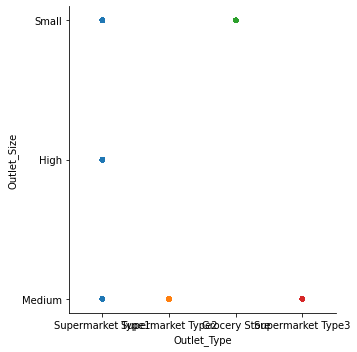

In [12]:
#cross check both the columns
plt.figure(figsize=(12,10))

sns.catplot(x="Outlet_Type", y="Outlet_Size", jitter=False, data=df)
plt.show
#this plot show that Outlet Identify would add equal weightage so wold delete Outletsize from Data frame 

In [13]:
df.isnull().sum()

Item_Identifier                 0
Item_Weight                     0
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                     0
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales            5681
dtype: int64

In [14]:
df['Item_Fat_Content'].value_counts()

Low Fat    8485
Regular    4824
LF          522
reg         195
low fat     178
Name: Item_Fat_Content, dtype: int64

In [15]:
df['Item_Fat_Content']=df['Item_Fat_Content'].replace({'Low Fat':0, 'LF':0, 'low fat':0,'Regular':1,'reg':1  })
df['Item_Fat_Content'].value_counts()

0    9185
1    5019
Name: Item_Fat_Content, dtype: int64

In [16]:
df['Item_Type'].value_counts()

Fruits and Vegetables    2013
Snack Foods              1989
Household                1548
Frozen Foods             1426
Dairy                    1136
Baking Goods             1086
Canned                   1084
Health and Hygiene        858
Meat                      736
Soft Drinks               726
Breads                    416
Hard Drinks               362
Others                    280
Starchy Foods             269
Breakfast                 186
Seafood                    89
Name: Item_Type, dtype: int64

In [17]:

df['Item_Identifier']=LE.fit_transform(df['Item_Identifier'])
df['Item_Type']=LE.fit_transform(df['Item_Type'])
df['Outlet_Identifier']=LE.fit_transform(df['Outlet_Identifier'])
df['Outlet_Size']=LE.fit_transform(df['Outlet_Size'])
df['Outlet_Location_Type']=LE.fit_transform(df['Outlet_Location_Type'])
df['Outlet_Type']=LE.fit_transform(df['Outlet_Type'])

In [18]:
df.info()
#decided to delete the missing information then imputing the values

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14204 entries, 0 to 14203
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            14204 non-null  int32  
 1   Item_Weight                14204 non-null  float64
 2   Item_Fat_Content           14204 non-null  int64  
 3   Item_Visibility            14204 non-null  float64
 4   Item_Type                  14204 non-null  int32  
 5   Item_MRP                   14204 non-null  float64
 6   Outlet_Identifier          14204 non-null  int32  
 7   Outlet_Establishment_Year  14204 non-null  int64  
 8   Outlet_Size                14204 non-null  int32  
 9   Outlet_Location_Type       14204 non-null  int32  
 10  Outlet_Type                14204 non-null  int32  
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int32(6), int64(2)
memory usage: 998.8 KB


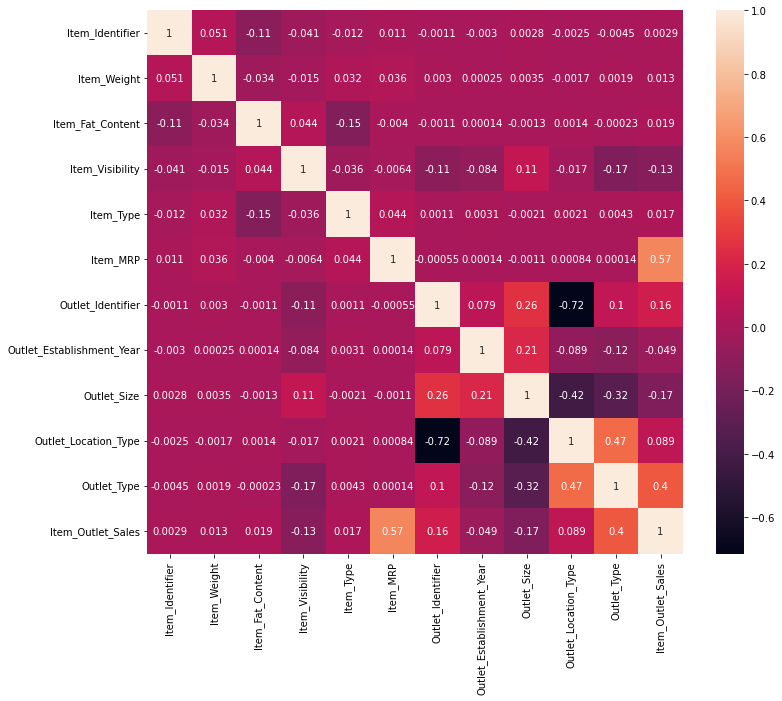

In [19]:
# Check the correlation between the columns
Corr=df.corr()
plt.figure(figsize=(12,10))
sns.heatmap(Corr,annot=True)
plt.show()

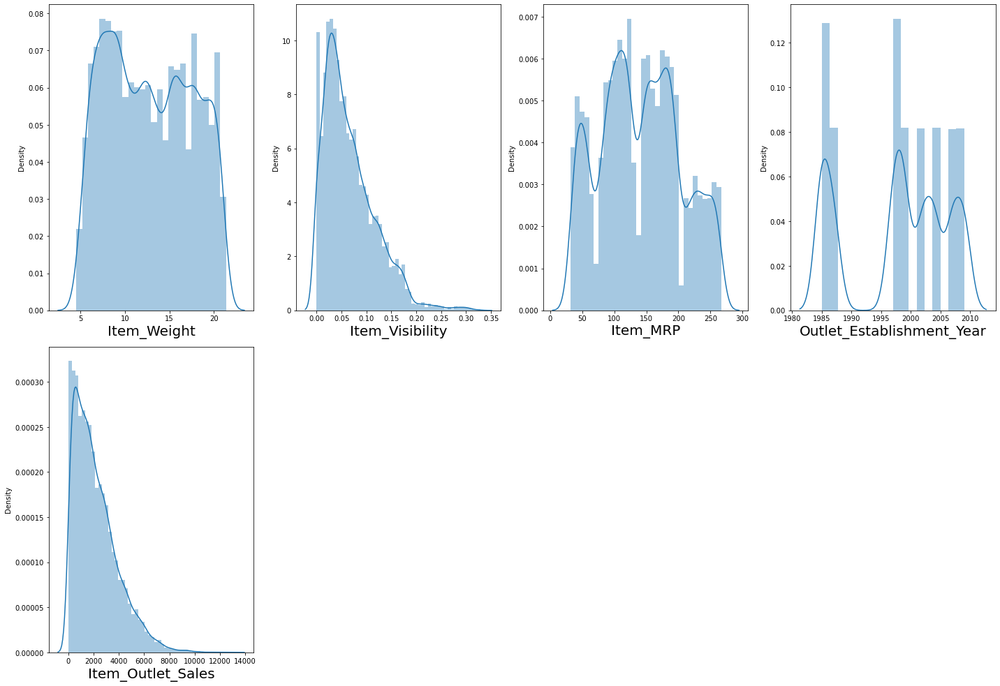

In [20]:
plt.figure(figsize=(20,20),facecolor='white')
plotnumber=1

for column in numerical_features:
    if plotnumber<=12:
        ax=plt.subplot(3,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.tight_layout()  


In [21]:
numerical_features.skew()
#Only Item visibility needs skewness correction

Item_Weight                  0.100417
Item_Visibility              1.195175
Item_MRP                     0.130728
Outlet_Establishment_Year   -0.396465
Item_Outlet_Sales            1.177531
dtype: float64

In [22]:
#Screwness Correction
from sklearn.preprocessing import power_transform
df6=pd.DataFrame(numerical_features['Item_Visibility'])
df6=power_transform(df6)
df_new=pd.DataFrame(df6,columns=['Item_Visibility'])
df['Item_Visibility']=df_new['Item_Visibility']
df

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,156,9.300,0,-1.149234,4,249.8092,9,1999,1,0,1,3735.1380
1,8,5.920,1,-1.038844,14,48.2692,3,2009,1,2,2,443.4228
2,662,17.500,0,-1.124586,10,141.6180,9,1999,1,0,1,2097.2700
3,1121,19.200,1,-1.751417,6,182.0950,0,1998,2,2,0,732.3800
4,1297,8.930,0,-1.751417,9,53.8614,1,1987,0,2,1,994.7052
5,758,10.395,1,-1.751417,0,51.4008,3,2009,1,2,2,556.6088
6,696,13.650,1,-1.265792,13,57.6588,1,1987,0,2,1,343.5528
7,738,19.000,0,1.259813,13,107.7622,5,1985,1,2,3,4022.7636
8,440,16.200,1,-1.127101,5,96.9726,7,2002,0,1,1,1076.5986
9,990,19.200,1,0.777918,5,187.8214,2,2007,0,1,1,4710.5350


In [23]:
#Seperate the test train x and y
Data_train=df[0: 8523]
Data_train
Data_test=df[8523:]
Data_test


,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
8523,1114,20.750,0,-1.455894,13,107.8622,9,1999,1,0,1,NaN
8524,1078,8.300,1,-0.449820,4,87.3198,2,2007,1,1,1,NaN
8525,1420,14.600,0,0.862195,11,241.7538,0,1998,2,2,0,NaN
8526,817,7.315,0,-1.172169,13,155.0340,2,2007,1,1,1,NaN
8527,1197,13.600,1,1.143712,4,234.2300,5,1985,1,2,3,NaN
8528,465,9.800,1,0.184759,6,117.1492,8,1997,2,0,1,NaN
8529,610,19.350,1,0.567697,0,50.1034,3,2009,1,2,2,NaN
8530,268,9.195,0,-1.158433,0,81.0592,5,1985,1,2,3,NaN
8531,674,6.305,1,1.207202,13,95.7436,7,2002,2,1,1,NaN
8532,172,5.985,0,-1.526803,0,186.8924,2,2007,2,1,1,NaN


In [24]:
df2
#Seperated perfectly both the dataFrame after EDA

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type
0,FDW58,20.750,Low Fat,0.007565,Snack Foods,107.8622,OUT049,1999,Medium,Tier 1,Supermarket Type1
1,FDW14,8.300,reg,0.038428,Dairy,87.3198,OUT017,2007,NaN,Tier 2,Supermarket Type1
2,NCN55,14.600,Low Fat,0.099575,Others,241.7538,OUT010,1998,NaN,Tier 3,Grocery Store
3,FDQ58,7.315,Low Fat,0.015388,Snack Foods,155.0340,OUT017,2007,NaN,Tier 2,Supermarket Type1
4,FDY38,NaN,Regular,0.118599,Dairy,234.2300,OUT027,1985,Medium,Tier 3,Supermarket Type3
5,FDH56,9.800,Regular,0.063817,Fruits and Vegetables,117.1492,OUT046,1997,Small,Tier 1,Supermarket Type1
6,FDL48,19.350,Regular,0.082602,Baking Goods,50.1034,OUT018,2009,Medium,Tier 3,Supermarket Type2
7,FDC48,NaN,Low Fat,0.015782,Baking Goods,81.0592,OUT027,1985,Medium,Tier 3,Supermarket Type3
8,FDN33,6.305,Regular,0.123365,Snack Foods,95.7436,OUT045,2002,NaN,Tier 2,Supermarket Type1
9,FDA36,5.985,Low Fat,0.005698,Baking Goods,186.8924,OUT017,2007,NaN,Tier 2,Supermarket Type1


In [25]:
#Check for Multicollinearity
x=Data_train.drop(columns=['Item_Outlet_Sales'],axis=1)
y=Data_train['Item_Outlet_Sales']

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns


vif_data["VIF"] = [variance_inflation_factor(x.values, i)
                          for i in range(len(x.columns))]
print(vif_data)
#I will drop Outlet_Establishment_Year, Outlet_Location_Type with highest VIF score

                      feature        VIF
0             Item_Identifier   4.082938
1                 Item_Weight   8.717179
2            Item_Fat_Content   1.601810
3             Item_Visibility   1.032710
4                   Item_Type   4.044128
5                    Item_MRP   6.139650
6           Outlet_Identifier  15.493628
7   Outlet_Establishment_Year  48.485835
8                 Outlet_Size   5.122213
9        Outlet_Location_Type  15.115616
10                Outlet_Type   8.533305


In [26]:
x=Data_train.drop(columns=['Item_Outlet_Sales','Outlet_Establishment_Year','Outlet_Location_Type'],axis=1)
y=Data_train['Item_Outlet_Sales']

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif_data = pd.DataFrame()
vif_data["feature"] = x.columns


vif_data["VIF"] = [variance_inflation_factor(x.values, i)
                          for i in range(len(x.columns))]
print(vif_data)
#Looks good to proceed with these features

             feature       VIF
0    Item_Identifier  3.645354
1        Item_Weight  6.663303
2   Item_Fat_Content  1.518395
3    Item_Visibility  1.030470
4          Item_Type  3.614925
5           Item_MRP  5.195057
6  Outlet_Identifier  4.100872
7        Outlet_Size  4.367276
8        Outlet_Type  3.305230


In [27]:
#Scale the fetures
scaler=StandardScaler()
x_scaled=scaler.fit_transform(x)
x_scaled

array([[-1.38851383, -0.76924555, -0.73814723, ...,  1.50781338,
        -0.38931184, -0.25265831],
       [-1.71799137, -1.49681258,  1.35474328, ..., -0.60707075,
        -0.38931184,  1.00297245],
       [-0.26205684,  0.9958579 , -0.73814723, ...,  1.50781338,
        -0.38931184, -0.25265831],
       ...,
       [ 1.28515188, -0.48941207, -0.73814723, ...,  0.45037131,
         0.97954327, -0.25265831],
       [-0.21975905, -1.21913167,  1.35474328, ..., -0.60707075,
        -0.38931184,  1.00297245],
       [-1.62449099,  0.4146653 , -0.73814723, ...,  1.15533269,
         0.97954327, -0.25265831]])

In [28]:
#Train the data to the model
x_train, x_test, y_train, y_test=train_test_split(x_scaled,y,test_size=0.25, random_state=100)

In [29]:
from sklearn.linear_model import LinearRegression
reg=LinearRegression()
reg.fit(x_train,y_train)
y_pred=reg.predict(x_test)
reg_accuracy=metrics.r2_score(y_test,y_pred)
print(reg_accuracy)

0.4935588342455426


In [30]:
from sklearn.ensemble import AdaBoostRegressor
ada=AdaBoostRegressor()
ada.fit(x_train,y_train)
y_pred=ada.predict(x_test)
ada_accuracy=metrics.r2_score(y_test,y_pred)
print(ada_accuracy)

0.49700202494913537


In [31]:
from sklearn.ensemble import RandomForestRegressor
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train,sample_weight=100)
y_pred=RFR.predict(x_test)
RFR_accuracy=metrics.r2_score(y_test,y_pred)
print(RFR_accuracy)

0.5553843586657286


In [32]:
#Cross Validation
from sklearn.model_selection import KFold,cross_val_score
k_f=KFold(n_splits=5, shuffle=True)
k_f
x_scaled=pd.DataFrame(x_scaled,columns=x.columns)
from sklearn.metrics import accuracy_score
k=5
acc_score = []

for train_index , test_index in k_f.split(x_scaled):
    x_train , x_test = x_scaled.iloc[train_index,:],x_scaled.iloc[test_index,:]
    y_train , y_test = y[train_index] , y[test_index]
     
    RFR.fit(x_train,y_train)
    pred_values = RFR.predict(x_test)
     
    acc = metrics.r2_score(y_test,pred_values)
    acc_score.append(acc)
     
avg_acc_score = sum(acc_score)/k
 
print('accuracy of each fold - {}'.format(acc_score))
print('Avg accuracy : {}'.format(avg_acc_score))

accuracy of each fold - [0.5197612676406995, 0.5617737866743822, 0.57599325269801, 0.5526268573500501, 0.5708454418957325]
Avg accuracy : 0.556200121251775


In [33]:
from sklearn.ensemble import GradientBoostingRegressor
gbdt_clf=GradientBoostingRegressor()
gbdt_clf.fit(x_train,y_train)
y_pred=gbdt_clf.predict(x_test)
gbdt_clf_accuracy=metrics.r2_score(y_test,y_pred)
gbdt_clf_accuracy

0.6037357084255821

In [34]:
#Cross Validation got GBRX
from sklearn.model_selection import KFold,cross_val_score
k_f=KFold(n_splits=5, shuffle=True)
k_f
x_scaled=pd.DataFrame(x_scaled,columns=x.columns)
from sklearn.metrics import accuracy_score
k=5
acc_score = []

for train_index , test_index in k_f.split(x_scaled):
    x_train , x_test = x_scaled.iloc[train_index,:],x_scaled.iloc[test_index,:]
    y_train , y_test = y[train_index] , y[test_index]
     
    gbdt_clf.fit(x_train,y_train)
    pred_values = gbdt_clf.predict(x_test)
     
    acc = metrics.r2_score(y_test,pred_values)
    acc_score.append(acc)
     
avg_acc_score = sum(acc_score)/k
 
print('accuracy of each fold - {}'.format(acc_score))
print('Avg accuracy : {}'.format(avg_acc_score))

accuracy of each fold - [0.6048765702254342, 0.6131777719755838, 0.6157841251671718, 0.5671093855964748, 0.5695106394685818]
Avg accuracy : 0.5940916984866493


In [35]:
#Will Go with GradientbOOST rEGRESSOR AND hYPERTUNE
from sklearn.model_selection import GridSearchCV

gbdt_clf=GradientBoostingRegressor()
params={"learning_rate":[0.01, 0.001, 0.2],
    "n_estimators":[15, 20]
       }
grd=GridSearchCV(gbdt_clf,param_grid=params,)
grd.fit(x_train,y_train)
gbdt_clf=grd.best_estimator_
y_pred=gbdt_clf.predict(x_test)
gbdt_clf_accuracy=metrics.r2_score(y_test,y_pred)
gbdt_clf_accuracy

0.5750343502233459

In [36]:
#Could not improve much on Hypertunning aftermultiple attems also.
with open("gbdt_clf", "wb") as f:
    pickle.dump(gbdt_clf, f)

In [37]:
scaler=StandardScaler()
Data_test_scaled=scaler.fit_transform(Data_test)
Data_test_scaled

array([[ 0.73984257,  1.73406439, -0.74081066, ..., -1.369215  ,
        -0.25276858,         nan],
       [ 0.6598806 , -0.93884521,  1.34987258, ..., -0.1388274 ,
        -0.25276858,         nan],
       [ 1.41951934,  0.41371146, -0.74081066, ...,  1.0915602 ,
        -1.50799439,         nan],
       ...,
       [ 1.43284634, -0.5738696 , -0.74081066, ..., -0.1388274 ,
        -0.25276858,         nan],
       [-0.57730882,  0.56399553,  1.34987258, ..., -0.1388274 ,
        -0.25276858,         nan],
       [ 0.47996616, -0.68121537,  1.34987258, ..., -0.1388274 ,
        -0.25276858,         nan]])

In [38]:
Data_test_scaled=pd.DataFrame(Data_test_scaled)
Data_test_scaled.drop(Data_test_scaled.columns[11], axis=1, inplace=True)
#Removing Established year
Data_test_scaled.drop(Data_test_scaled.columns[7], axis=1, inplace=True)
#Removing Outlet location type
Data_test_scaled.drop(Data_test_scaled.columns[9], axis=1, inplace=True)
Data_test_scaled.shape

(5681, 9)

In [39]:
#tESTING THE mODEL WITH THE tEST DATAsET

y_pred_test=gbdt_clf.predict(Data_test_scaled)
y_pred_test


#gbdt_clf_accuracy=metrics.r2_score(y_test,y_pred_TEST)
#gbdt_clf_accuracy

array([ 394.97653941, 1401.21601203, 3737.33130767, ..., 1898.68629291,
       3427.76966081, 1210.32448279])